In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from templates import *
from templates_cls import *
from experiment_classifier import ClsModel

C:\Users\tsj_g\2021118_yoshiike\.venv\Lib\site-packages\torchaudio\backend\utils.py:74: UserWarning: No audio backend is available.
  warnings.warn("No audio backend is available.")


In [3]:
device = 'cuda:0'
conf = ffhq256_autoenc()
# print(conf.name)
model = LitModel(conf)
state = torch.load(f'checkpoints/{conf.name}/last.ckpt', map_location='cpu')
model.load_state_dict(state['state_dict'], strict=False)
model.ema_model.eval()
model.ema_model.to(device);

Global seed set to 0


Model params: 160.69 M


In [4]:
cls_conf = ffhq256_autoenc_cls()
cls_model = ClsModel(cls_conf)
state = torch.load(f'checkpoints/{cls_conf.name}/last.ckpt',
                    map_location='cpu')
print('latent step:', state['global_step'])
cls_model.load_state_dict(state['state_dict'], strict=False)
cls_model.to(device);

Global seed set to 0


loading pretrain ... 130M
step: 1563562
loading latent stats ...
latent step: 9375


## 選択

In [173]:
select_mode = 2

is_normal = False
is_plus_mask = False
is_only_mask = False

if select_mode == 0:
    is_normal = True
elif select_mode == 1:
    is_plus_mask = True
elif select_mode == 2:
    is_only_mask = True

In [174]:
path_src = 'imgs_evaluate/imgs_source'
for i,file in enumerate(os.listdir(path_src)):
    print(i, file)

0 ookawa_default-ookawa_angry2
1 yotaka_default-yotaka_angry2
2 yotaka_default-yotaka_smile


In [175]:
ind_src = 2
ind_parts = [0,1,12,13,6,7,2,5,8,11,3,4,9,10]  # いじらない
ind_mask = [3,8,6,7,3,2,3,1,3,5,3,0,3,4]  # いじらない
path_src_mta = f'{path_src}/{os.listdir(path_src)[ind_src]}'
name_src = os.listdir(path_src)[ind_src]
data_src = ImageDataset(f'{path_src_mta}/parts', image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False)
batch_src = torch.tensor([])
for data in data_src:
    batch_src = torch.cat([batch_src, data['img'][None]])
data_src_mask = ImageDataset(f'{path_src_mta}/mask', image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False)
batch_src_mask = torch.tensor([])
for data in data_src_mask:
    batch_src_mask = torch.cat([batch_src_mask, data['img'][None]])

flag_change = False

In [176]:
path_tgt = 'imgs_evaluate/imgs_target'
for i,file in enumerate(os.listdir(f'{path_tgt}/img')):
    print(i, file)

0 glasses.png
1 takebe_default.png
2 test01_03.png
3 test02_02.png
4 woman_default.png


In [177]:
ind_tgt = {1,2,4}
data_tgt = ImageDataset(f'{path_tgt}/img', image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False)
batch_tgt = torch.tensor([])
name_tgt = []
for i,data in enumerate(data_tgt):
    if i in ind_tgt:
        batch_tgt = torch.cat([batch_tgt, data['img'][None]])
        name_tgt.append(os.path.splitext(str(data_tgt.paths[i]))[0])
data_tgt_mask = ImageDataset(f'{path_tgt}/mask', image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False)
batch_tgt_mask = torch.tensor([])
for i,data in enumerate(data_tgt_mask):
    if i in ind_tgt:
        batch_tgt_mask = torch.cat([batch_tgt_mask, data['img'][None]])

flag_change = False

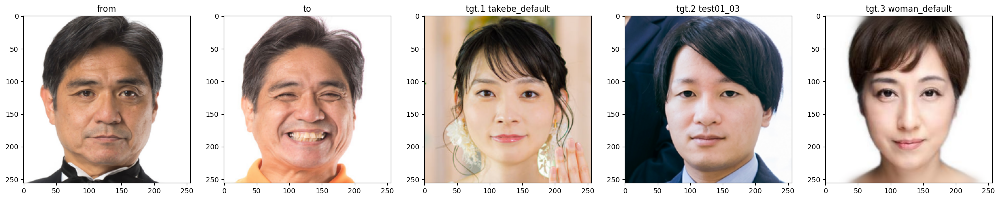

In [178]:
import matplotlib.pyplot as plt

num_tgt = len(batch_tgt)
fig, ax = plt.subplots(1, 2+num_tgt, figsize=(5*(2+num_tgt), 5))
ax[0].imshow(batch_src[0].permute([1, 2, 0]) / 2 + 0.5)
ax[0].set_title(f"from")
ax[1].imshow(batch_src[1].permute([1, 2, 0]) / 2 + 0.5)
ax[1].set_title(f"to")

for i in range(num_tgt):
    ax[i+2].imshow(batch_tgt[i].permute([1, 2, 0]) / 2 + 0.5)
    ax[i+2].set_title(f"tgt.{i+1} {name_tgt[i]}")

plt.show()

In [179]:
cond_tgt = torch.tensor([], device=device)
xT = torch.tensor([], device=device)
for i in range(num_tgt):
    cond_tgt = torch.cat([cond_tgt, model.encode(batch_tgt[i][None].to(device))], dim=0)
    xT = torch.cat([xT, model.encode_stochastic(batch_tgt[i][None].to(device), cond_tgt[i][None], T=250)], dim=0)

In [180]:
alpha = torch.tensor(np.linspace(0, 1, 11, dtype=np.float32)).to(device)

## all

In [181]:
ind_tmp = [0,1]
batch_src_all = torch.stack([batch_src[ind_parts[ind_tmp[0]]], batch_src[ind_parts[ind_tmp[1]]]]).to(device)
cond_src_all = model.encode(batch_src_all)
cond_change_all = cond_src_all[1] - cond_src_all[0]

batch_src_mask_all = torch.stack([batch_src_mask[ind_mask[ind_tmp[0]]], batch_src_mask[ind_mask[ind_tmp[1]]]]).to(device)
cond_src_mask_all = model.encode(batch_src_mask_all)
cond_change_mask_all = cond_src_mask_all[1] - cond_src_mask_all[0]

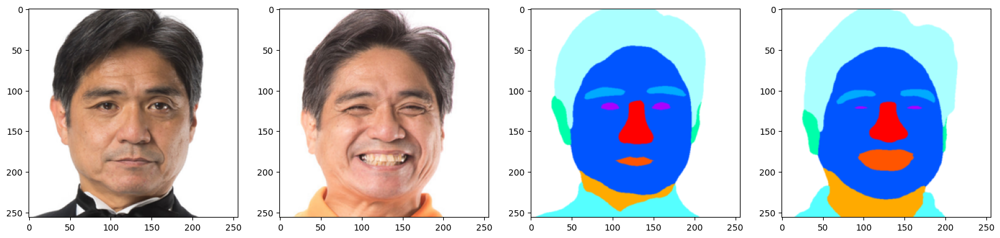

In [182]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(5*4, 5))
ax[0].imshow(batch_src[ind_parts[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_src[ind_parts[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
ax[2].imshow(batch_src_mask[ind_mask[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[3].imshow(batch_src_mask[ind_mask[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [184]:
preds_all = torch.tensor([], device=device)
for i in range(num_tgt):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond = 0
        if is_normal:
            cond = cond_tgt[i] + alp * cond_change_all
        if is_plus_mask:
            cond = cond_tgt[i] + alp * (cond_change_all + cond_change_mask_all)
        if is_only_mask:
            cond = cond_tgt[i] + alp * cond_change_mask_all
        pred = model.render(xT[i][None], cond[None], T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_all = torch.cat([preds_all, preds_tmp[None]], dim=0)

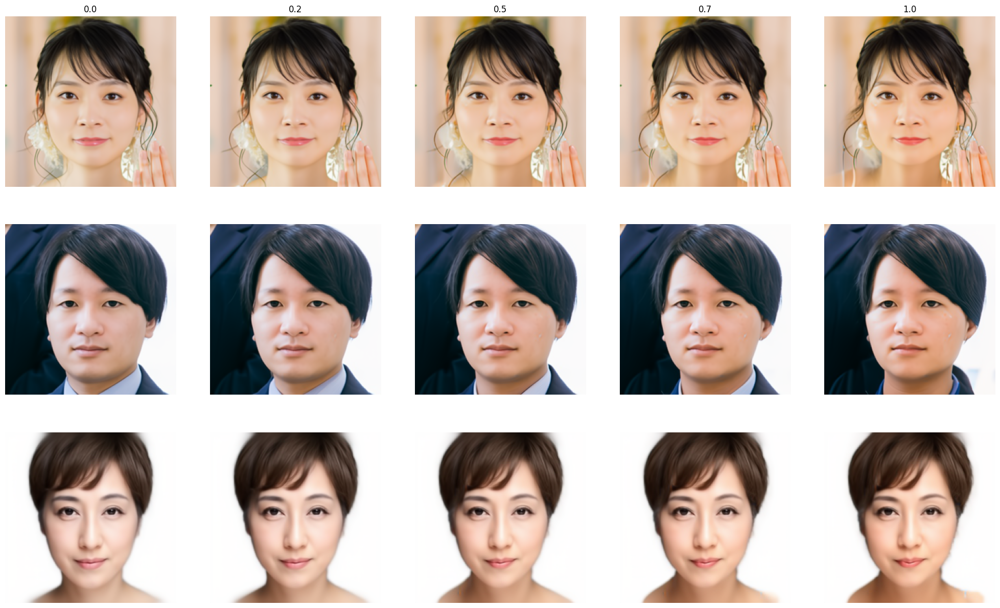

In [185]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_tgt, num_show, figsize=(5*num_show, 5*num_tgt))
for i,pred in enumerate(preds_all):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_all) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [186]:
from PIL import Image

preds_all_pil = []
for pred in preds_all:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_all_pil.append(pred_pil)

## pose

In [187]:
ind_tmp = [2,3]
batch_src_pose = torch.stack([batch_src[ind_parts[ind_tmp[0]]], batch_src[ind_parts[ind_tmp[1]]]]).to(device)
cond_src_pose = model.encode(batch_src_pose)
cond_change_pose = cond_src_pose[1] - cond_src_pose[0]

batch_src_mask_pose = torch.stack([batch_src_mask[ind_mask[ind_tmp[0]]], batch_src_mask[ind_mask[ind_tmp[1]]]]).to(device)
cond_src_mask_pose = model.encode(batch_src_mask_pose)
cond_change_mask_pose = cond_src_mask_pose[1] - cond_src_mask_pose[0]

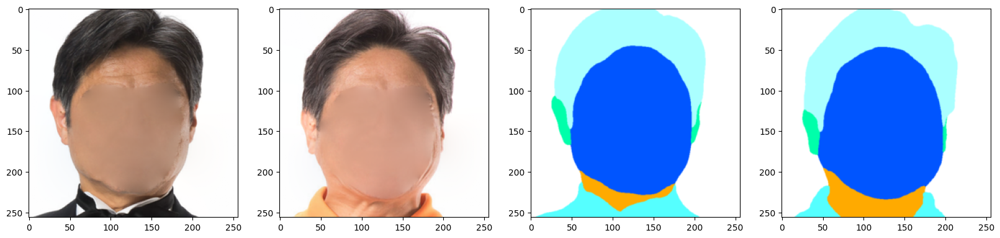

In [188]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(5*4, 5))
ax[0].imshow(batch_src[ind_parts[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_src[ind_parts[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
ax[2].imshow(batch_src_mask[ind_mask[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[3].imshow(batch_src_mask[ind_mask[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [189]:
preds_pose = torch.tensor([], device=device)
for i in range(num_tgt):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond = 0
        if is_normal:
            cond = cond_tgt[i] + alp * cond_change_pose
        if is_plus_mask:
            cond = cond_tgt[i] + alp * (cond_change_pose + cond_change_mask_pose)
        if is_only_mask:
            cond = cond_tgt[i] + alp * cond_change_mask_pose
        pred = model.render(xT[i][None], cond[None], T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_pose = torch.cat([preds_pose, preds_tmp[None]], dim=0)

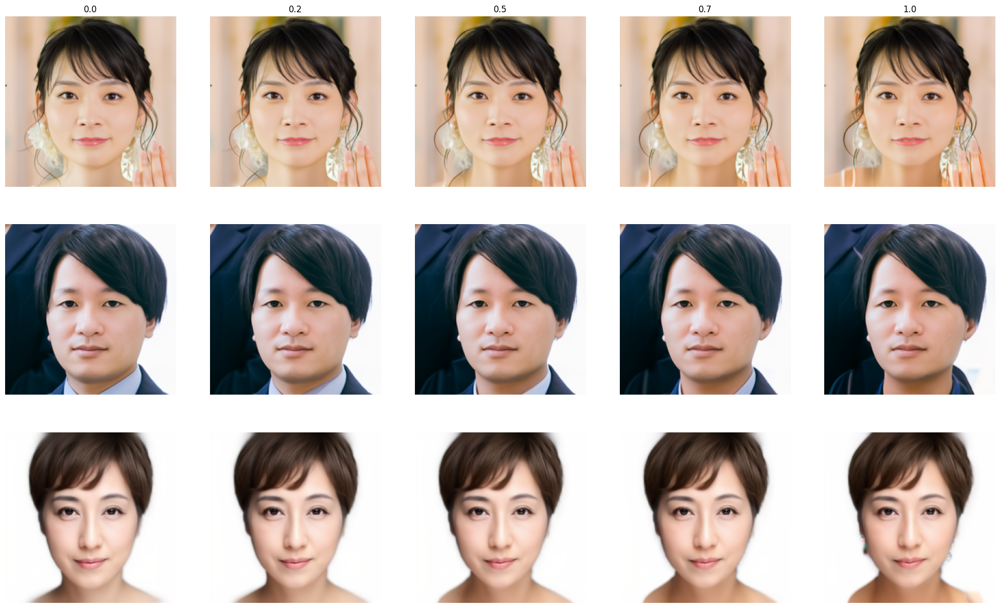

In [190]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_tgt, num_show, figsize=(5*num_show, 5*num_tgt))
for i,pred in enumerate(preds_pose):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_pose) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [191]:
from PIL import Image

preds_pose_pil = []
for pred in preds_pose:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_pose_pil.append(pred_pil)

## face-all

In [192]:
ind_tmp = [4,5]
batch_src_face = torch.stack([batch_src[ind_parts[ind_tmp[0]]], batch_src[ind_parts[ind_tmp[1]]]]).to(device)
cond_src_face = model.encode(batch_src_face)
cond_change_face = cond_src_face[1] - cond_src_face[0]

batch_src_mask_face = torch.stack([batch_src_mask[ind_mask[ind_tmp[0]]], batch_src_mask[ind_mask[ind_tmp[1]]]]).to(device)
cond_src_mask_face = model.encode(batch_src_mask_face)
cond_change_mask_face = cond_src_mask_face[1] - cond_src_mask_face[0]

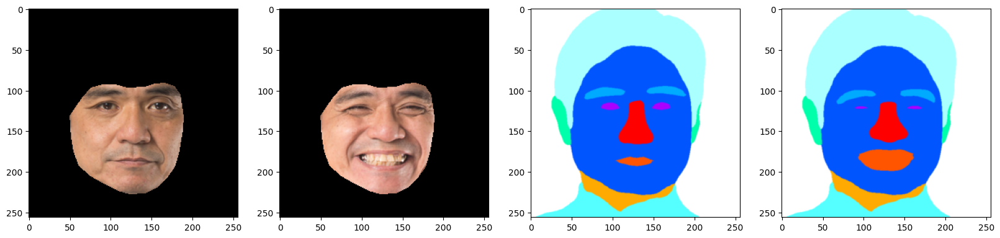

In [193]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(5*4, 5))
ax[0].imshow(batch_src[ind_parts[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_src[ind_parts[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
ax[2].imshow(batch_src_mask[ind_mask[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[3].imshow(batch_src_mask[ind_mask[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [194]:
preds_face = torch.tensor([], device=device)
for i in range(num_tgt):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond = 0
        if is_normal:
            cond = cond_tgt[i] + alp * cond_change_face
        if is_plus_mask:
            cond = cond_tgt[i] + alp * (cond_change_face + cond_change_mask_face)
        if is_only_mask:
            cond = cond_tgt[i] + alp * cond_change_mask_face
        pred = model.render(xT[i][None], cond[None], T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_face = torch.cat([preds_face, preds_tmp[None]], dim=0)

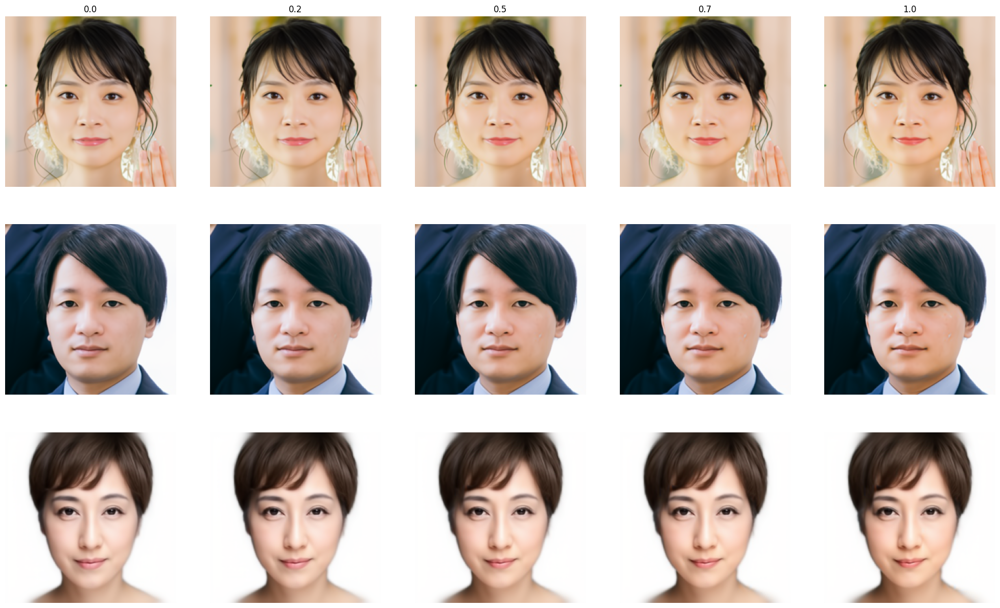

In [195]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_tgt, num_show, figsize=(5*num_show, 5*num_tgt))
for i,pred in enumerate(preds_face):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_face) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [196]:
from PIL import Image

preds_face_pil = []
for pred in preds_face:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_face_pil.append(pred_pil)

## eye

In [197]:
ind_tmp = [6,7]
batch_src_eye = torch.stack([batch_src[ind_parts[ind_tmp[0]]], batch_src[ind_parts[ind_tmp[1]]]]).to(device)
cond_src_eye = model.encode(batch_src_eye)
cond_change_eye = cond_src_eye[1] - cond_src_eye[0]

batch_src_mask_eye = torch.stack([batch_src_mask[ind_mask[ind_tmp[0]]], batch_src_mask[ind_mask[ind_tmp[1]]]]).to(device)
cond_src_mask_eye = model.encode(batch_src_mask_eye)
cond_change_mask_eye = cond_src_mask_eye[1] - cond_src_mask_eye[0]

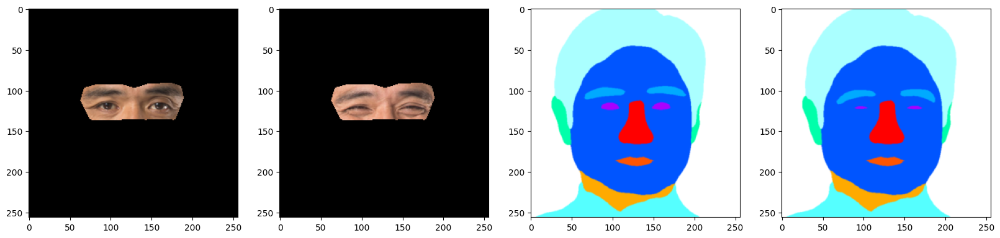

In [198]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(5*4, 5))
ax[0].imshow(batch_src[ind_parts[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_src[ind_parts[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
ax[2].imshow(batch_src_mask[ind_mask[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[3].imshow(batch_src_mask[ind_mask[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [199]:
preds_eye = torch.tensor([], device=device)
for i in range(num_tgt):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond = 0
        if is_normal:
            cond = cond_tgt[i] + alp * cond_change_eye
        if is_plus_mask:
            cond = cond_tgt[i] + alp * (cond_change_eye + cond_change_mask_eye)
        if is_only_mask:
            cond = cond_tgt[i] + alp * cond_change_mask_eye
        pred = model.render(xT[i][None], cond[None], T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_eye = torch.cat([preds_eye, preds_tmp[None]], dim=0)

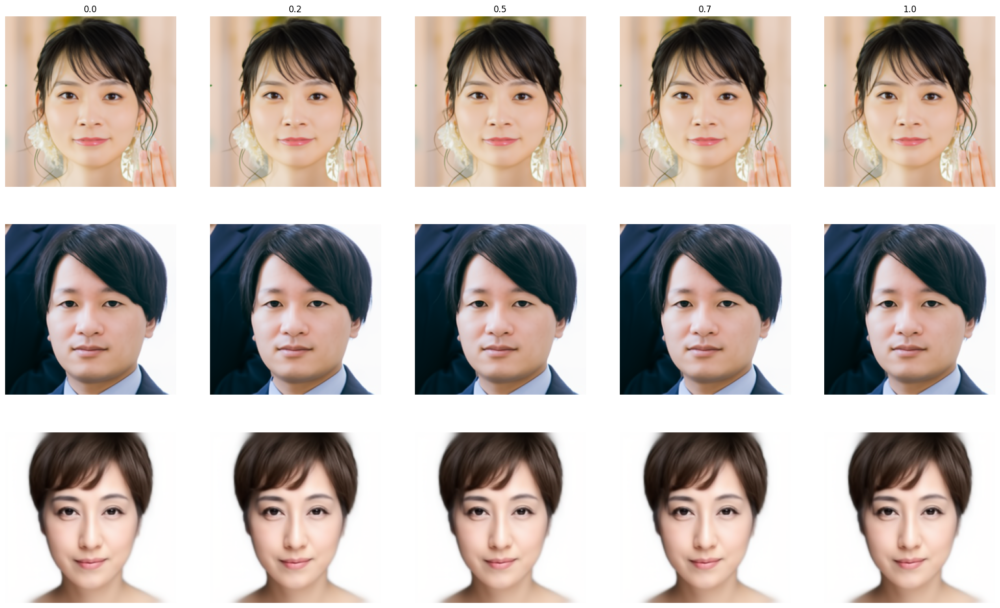

In [200]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_tgt, num_show, figsize=(5*num_show, 5*num_tgt))
for i,pred in enumerate(preds_eye):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [201]:
from PIL import Image

preds_eye_pil = []
for pred in preds_eye:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eye_pil.append(pred_pil)

## mouth

In [202]:
ind_tmp = [8,9]
batch_src_mouth = torch.stack([batch_src[ind_parts[ind_tmp[0]]], batch_src[ind_parts[ind_tmp[1]]]]).to(device)
cond_src_mouth = model.encode(batch_src_mouth)
cond_change_mouth = cond_src_mouth[1] - cond_src_mouth[0]

batch_src_mask_mouth = torch.stack([batch_src_mask[ind_mask[ind_tmp[0]]], batch_src_mask[ind_mask[ind_tmp[1]]]]).to(device)
cond_src_mask_mouth = model.encode(batch_src_mask_mouth)
cond_change_mask_mouth = cond_src_mask_mouth[1] - cond_src_mask_mouth[0]

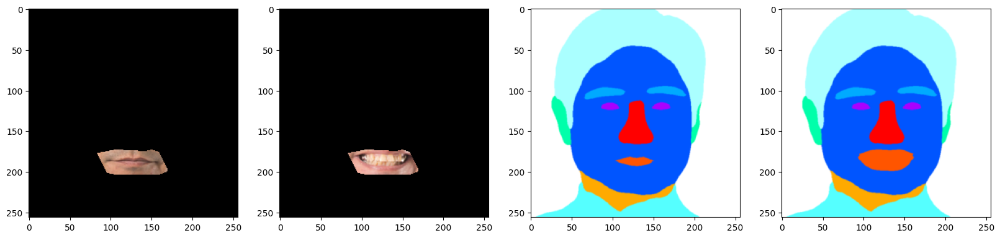

In [203]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(5*4, 5))
ax[0].imshow(batch_src[ind_parts[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_src[ind_parts[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
ax[2].imshow(batch_src_mask[ind_mask[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[3].imshow(batch_src_mask[ind_mask[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [204]:
preds_mouth = torch.tensor([], device=device)
for i in range(num_tgt):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond = 0
        if is_normal:
            cond = cond_tgt[i] + alp * cond_change_mouth
        if is_plus_mask:
            cond = cond_tgt[i] + alp * (cond_change_mouth + cond_change_mask_mouth)
        if is_only_mask:
            cond = cond_tgt[i] + alp * cond_change_mask_mouth
        pred = model.render(xT[i][None], cond[None], T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_mouth = torch.cat([preds_mouth, preds_tmp[None]], dim=0)

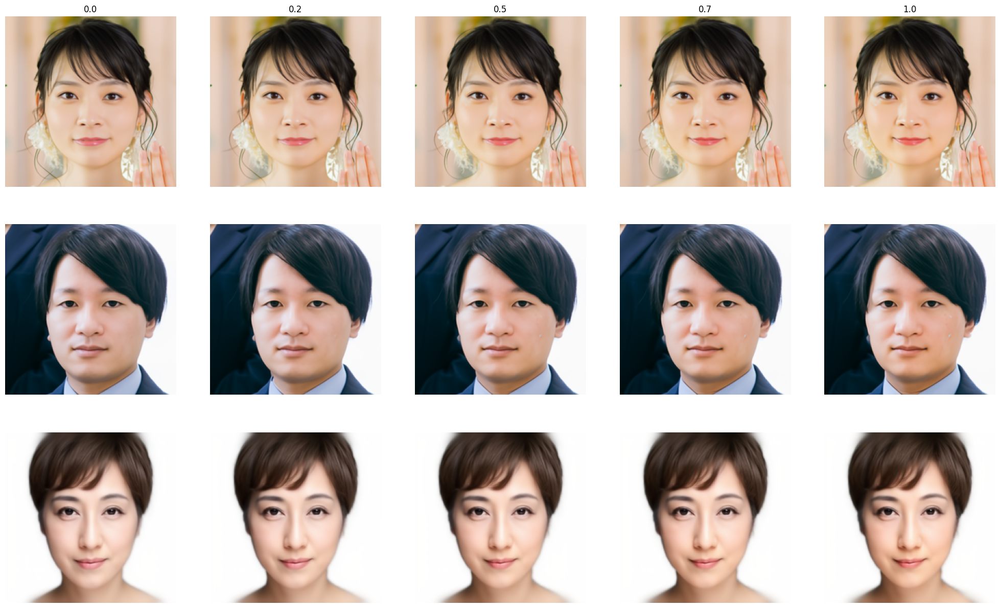

In [205]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_tgt, num_show, figsize=(5*num_show, 5*num_tgt))
for i,pred in enumerate(preds_mouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [206]:
from PIL import Image

preds_mouth_pil = []
for pred in preds_mouth:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_mouth_pil.append(pred_pil)

## eye&mouth

In [207]:
ind_tmp = [10,11]
batch_src_eyemouth = torch.stack([batch_src[ind_parts[ind_tmp[0]]], batch_src[ind_parts[ind_tmp[1]]]]).to(device)
cond_src_eyemouth = model.encode(batch_src_eyemouth)
cond_change_eyemouth = cond_src_eyemouth[1] - cond_src_eyemouth[0]

batch_src_mask_eyemouth = torch.stack([batch_src_mask[ind_mask[ind_tmp[0]]], batch_src_mask[ind_mask[ind_tmp[1]]]]).to(device)
cond_src_mask_eyemouth = model.encode(batch_src_mask_eyemouth)
cond_change_mask_eyemouth = cond_src_mask_eyemouth[1] - cond_src_mask_eyemouth[0]

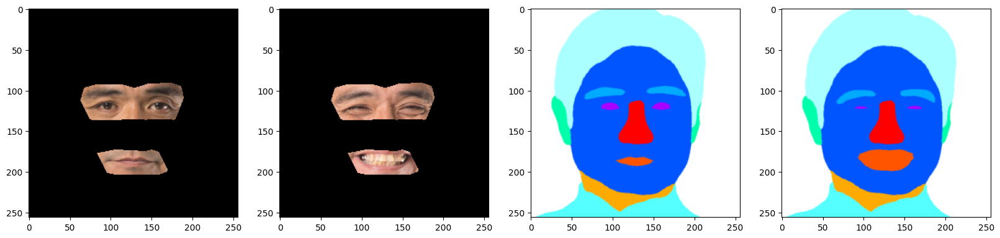

In [208]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(5*4, 5))
ax[0].imshow(batch_src[ind_parts[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_src[ind_parts[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
ax[2].imshow(batch_src_mask[ind_mask[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[3].imshow(batch_src_mask[ind_mask[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [209]:
preds_eyemouth = torch.tensor([], device=device)
for i in range(num_tgt):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond = 0
        if is_normal:
            cond = cond_tgt[i] + alp * cond_change_eyemouth
        if is_plus_mask:
            cond = cond_tgt[i] + alp * (cond_change_eyemouth + cond_change_mask_eyemouth)
        if is_only_mask:
            cond = cond_tgt[i] + alp * cond_change_mask_eyemouth
        pred = model.render(xT[i][None], cond[None], T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_eyemouth = torch.cat([preds_eyemouth, preds_tmp[None]], dim=0)

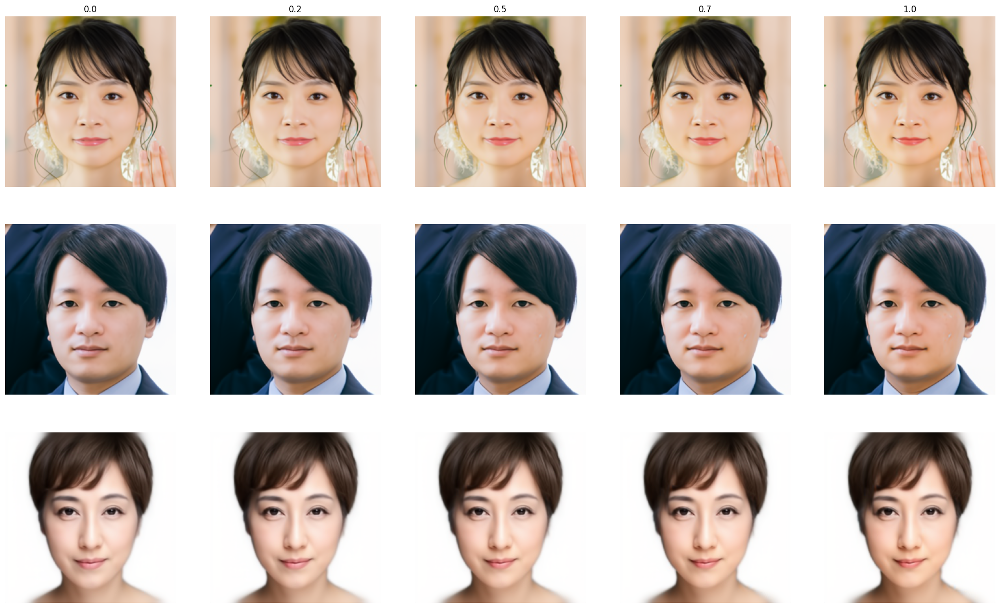

In [210]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_tgt, num_show, figsize=(5*num_show, 5*num_tgt))
for i,pred in enumerate(preds_eyemouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eyemouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [211]:
from PIL import Image

preds_eyemouth_pil = []
for pred in preds_eyemouth:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eyemouth_pil.append(pred_pil)

## mouth&nose

In [212]:
ind_tmp = [12,13]
batch_src_mouthnose = torch.stack([batch_src[ind_parts[ind_tmp[0]]], batch_src[ind_parts[ind_tmp[1]]]]).to(device)
cond_src_mouthnose = model.encode(batch_src_mouthnose)
cond_change_mouthnose = cond_src_mouthnose[1] - cond_src_mouthnose[0]

batch_src_mask_mouthnose = torch.stack([batch_src_mask[ind_mask[ind_tmp[0]]], batch_src_mask[ind_mask[ind_tmp[1]]]]).to(device)
cond_src_mask_mouthnose = model.encode(batch_src_mask_mouthnose)
cond_change_mask_mouthnose = cond_src_mask_mouthnose[1] - cond_src_mask_mouthnose[0]

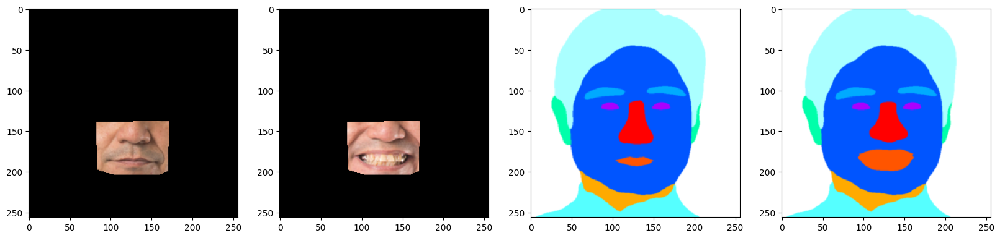

In [213]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 4, figsize=(5*4, 5))
ax[0].imshow(batch_src[ind_parts[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_src[ind_parts[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
ax[2].imshow(batch_src_mask[ind_mask[ind_tmp[0]]].permute([1, 2, 0]) / 2 + 0.5)
ax[3].imshow(batch_src_mask[ind_mask[ind_tmp[1]]].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [214]:
preds_mouthnose = torch.tensor([], device=device)
for i in range(num_tgt):
    preds_tmp = torch.tensor([], device=device)
    for j,alp in enumerate(alpha):
        cond = 0
        if is_normal:
            cond = cond_tgt[i] + alp * cond_change_mouthnose
        if is_plus_mask:
            cond = cond_tgt[i] + alp * (cond_change_mouthnose + cond_change_mask_mouthnose)
        if is_only_mask:
            cond = cond_tgt[i] + alp * cond_change_mask_mouthnose
        pred = model.render(xT[i][None], cond[None], T=20)
        preds_tmp = torch.cat([preds_tmp, pred], dim=0)
    preds_mouthnose = torch.cat([preds_mouthnose, preds_tmp[None]], dim=0)

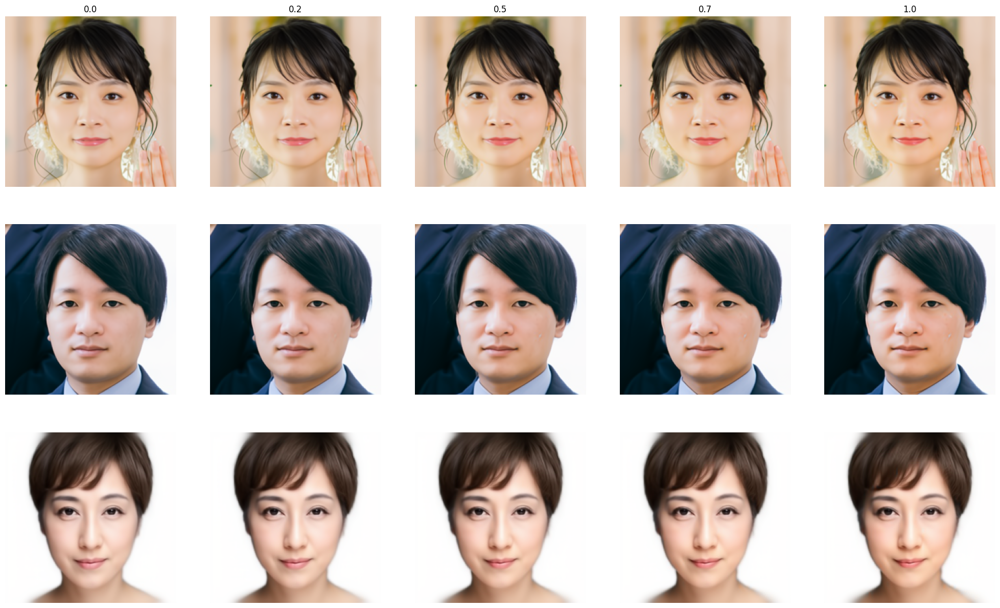

In [215]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_tgt, num_show, figsize=(5*num_show, 5*num_tgt))
for i,pred in enumerate(preds_mouthnose):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouthnose) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [216]:
from PIL import Image

preds_mouthnose_pil = []
for pred in preds_mouthnose:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_mouthnose_pil.append(pred_pil)

## gifの保存

In [217]:
dst_dir = None
if is_normal:
    dst_dir = f"imgs_evaluate/results/transfer/{name_src}"
if is_plus_mask:
    dst_dir = f"imgs_evaluate/results/transfer_plus_mask/{name_src}"
if is_only_mask:
    dst_dir = f"imgs_evaluate/results/transfer_only_mask/{name_src}"

flag_change = True

### all

In [218]:
if flag_change:
    for i,pred_pil in enumerate(preds_all_pil):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/all/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
        dst_path = dst_dir_parts + file_name
    
        pred_pil[0].save(
            dst_path,
            format="gif",
            save_all=True,
            append_images=pred_pil,
            duration=3000//(len(alpha)),
            loop=0,
        )

### pose

In [219]:
if flag_change:
    for i,pred_pil in enumerate(preds_pose_pil):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/pose/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
        dst_path = dst_dir_parts + file_name
    
        pred_pil[0].save(
            dst_path,
            format="gif",
            save_all=True,
            append_images=pred_pil,
            duration=3000//(len(alpha)),
            loop=0,
        )

### face-all

In [220]:
if flag_change:
    for i,pred_pil in enumerate(preds_face_pil):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/face-all/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
        dst_path = dst_dir_parts + file_name
    
        pred_pil[0].save(
            dst_path,
            format="gif",
            save_all=True,
            append_images=pred_pil,
            duration=3000//(len(alpha)),
            loop=0,
        )

### eye

In [221]:
if flag_change:
    for i,pred_pil in enumerate(preds_eye_pil):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/eye/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
        dst_path = dst_dir_parts + file_name
    
        pred_pil[0].save(
            dst_path,
            format="gif",
            save_all=True,
            append_images=pred_pil,
            duration=3000//(len(alpha)),
            loop=0,
        )

### mouth

In [222]:
if flag_change:
    for i,pred_pil in enumerate(preds_mouth_pil):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/mouth/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
        dst_path = dst_dir_parts + file_name
    
        pred_pil[0].save(
            dst_path,
            format="gif",
            save_all=True,
            append_images=pred_pil,
            duration=3000//(len(alpha)),
            loop=0,
        )

### eye&mouth

In [223]:
if flag_change:
    for i,pred_pil in enumerate(preds_eyemouth_pil):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/eye-mouth/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
        dst_path = dst_dir_parts + file_name
    
        pred_pil[0].save(
            dst_path,
            format="gif",
            save_all=True,
            append_images=pred_pil,
            duration=3000//(len(alpha)),
            loop=0,
        )

### mouth&nose

In [224]:
if flag_change:
    for i,pred_pil in enumerate(preds_mouthnose_pil):
            dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/mouth-nose/"
            if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
            file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
            dst_path = dst_dir_parts + file_name
        
            pred_pil[0].save(
                dst_path,
                format="gif",
                save_all=True,
                append_images=pred_pil,
                duration=3000//(len(alpha)),
                loop=0,
            )

## 静止画像（フレーム）の保存

### all

In [225]:
from torchvision.utils import save_image

if flag_change:
    # select_ind = {0,12,24,36,47,59}
    select_ind = {0,2,4,6,8,10}
    for i,pred in enumerate(preds_all):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/all/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        for j,p in enumerate(pred):
            if j in select_ind:
                file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
                save_image(p, file_name, format='PNG')

### pose

In [226]:
from torchvision.utils import save_image

if flag_change:
    # select_ind = {0,12,24,36,47,59}
    select_ind = {0,2,4,6,8,10}
    for i,pred in enumerate(preds_pose):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/pose/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        for j,p in enumerate(pred):
            if j in select_ind:
                file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
                save_image(p, file_name, format='PNG')

### face-all

In [227]:
from torchvision.utils import save_image

if flag_change:
    # select_ind = {0,12,24,36,47,59}
    select_ind = {0,2,4,6,8,10}
    for i,pred in enumerate(preds_face):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/face-all/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        for j,p in enumerate(pred):
            if j in select_ind:
                file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
                save_image(p, file_name, format='PNG')

### eye

In [228]:
from torchvision.utils import save_image

if flag_change:
    # select_ind = {0,12,24,36,47,59}
    select_ind = {0,2,4,6,8,10}
    for i,pred in enumerate(preds_eye):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/eye/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        for j,p in enumerate(pred):
            if j in select_ind:
                file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
                save_image(p, file_name, format='PNG')

### mouth

In [229]:
from torchvision.utils import save_image

if flag_change:
    # select_ind = {0,12,24,36,47,59}
    select_ind = {0,2,4,6,8,10}
    for i,pred in enumerate(preds_mouth):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/mouth/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        for j,p in enumerate(pred):
            if j in select_ind:
                file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
                save_image(p, file_name, format='PNG')

### eye&mouth

In [230]:
from torchvision.utils import save_image

if flag_change:
    # select_ind = {0,12,24,36,47,59}
    select_ind = {0,2,4,6,8,10}
    for i,pred in enumerate(preds_eyemouth):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/eye-mouth/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        for j,p in enumerate(pred):
            if j in select_ind:
                file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
                save_image(p, file_name, format='PNG')

### mouth&nose

In [231]:
from torchvision.utils import save_image

if flag_change:
    # select_ind = {0,12,24,36,47,59}
    select_ind = {0,2,4,6,8,10}
    for i,pred in enumerate(preds_mouthnose):
        dst_dir_parts = f"{dst_dir}/{name_tgt[i]}/mouth-nose/"
        if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
        for j,p in enumerate(pred):
            if j in select_ind:
                file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
                save_image(p, file_name, format='PNG')